#  INTRODUCTION

- Banking Sector in India contributes around 7.7% of the GDP(Gross Domestic Product), which makes it one of the most stable       pillars in the ecomonic development of the country.
- A sizeable chunk of the revenue of the banking sector is created by interests, fees and charges on financial products.
- Credit Card is one of the main sources where the banking industry gains it's revenue.


# Project

### Project proposal to predict credit card approval and find valuable insights and patterns in the given data.

- Why is your proposal important in today’s world? How predicting a good client is worthy for a bank?  

- How is it going to impact the banking sector? 

- If any, what is the gap in the knowledge or how your proposed method can be helpful if required in future for any bank in India.

* The defaults in credit card payment and bad debts are increasing daily creating a huge pressure on the banking industry, where
  the risk of revenue decrease is increasing. It has huge implications on the economy as well.
* Therefore it is imperative for the banks to choose the credit card customers wisely.

## Hypothesis and Aim

- Here we are calculating whether to give Credit Card to a customer or not.
- For this we have to identify whether a customer is good or bad according to the economic behaviour or other features.
- For the initial/null hypothesis we are considering that neither of the features affect the customer defaulting on the           payments.
- Identifying the important features that have an affect on the customer behaviour and finding out patterns and insights is one   of the most important aim of the project.
- After that we will use Machine Learning algorithms to predict whether the customer should be provided with Credit Card or not.

### Basic Info Of The Dataset
- The dataset contains 19 features and 1548 records. The features along with their basic details are given below:-

Features name: (Credit_Card.csv)

Ind_ID: Client ID

Gender: Gender information

Car_owner: Having car or not

Propert_owner: Having property or not

Children: Count of children

Annual_income: Annual income

Type_Income: Income type

Education: Education level

Marital_status: Marital_status

Housing_type: Living style

Birthday_count: Use backward count from current day (0), -1 means yesterday.

Employed_days: Start date of employment. Use backward count from current day (0). Positive value means, individual is currently unemployed.

Mobile_phone: Any mobile phone

Work_phone: Any work phone

Phone: Any phone number

EMAIL_ID: Any email ID

Type_Occupation: Occupation

Family_Members: Family size


Another data set (Credit_card_label.csv) contains two key pieces of information

ID: The joining key between application data and credit status data, same is Ind_ID

Label: 0 is application approved and 1 is application rejected. 



In [1]:
#importing necessary libraries for the project.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px


In [2]:
#upload both datasets using pandas.
df=pd.read_csv(r"C:\Users\ankit\Downloads\Capstone+Project+1\Credit_card.csv")
df1=pd.read_csv(r"C:\Users\ankit\Downloads\Capstone+Project+1\Credit_card_label.csv")

In [3]:
#merging both dataframes for analysis and sql queries.
df_merged=df.merge(df1,on='Ind_ID')

In [4]:
#checking the merged dataframe.
df_merged

,Ind_ID,GENDER,Car_Owner,Propert_Owner,CHILDREN,Annual_income,Type_Income,EDUCATION,Marital_status,Housing_type,Birthday_count,Employed_days,Mobile_phone,Work_Phone,Phone,EMAIL_ID,Type_Occupation,Family_Members,label
0,5008827,M,Y,Y,0,180000.0,Pensioner,Higher education,Married,House / apartment,-18772.0,365243,1,0,0,0,NaN,2,1
1,5009744,F,Y,N,0,315000.0,Commercial associate,Higher education,Married,House / apartment,-13557.0,-586,1,1,1,0,NaN,2,1
2,5009746,F,Y,N,0,315000.0,Commercial associate,Higher education,Married,House / apartment,NaN,-586,1,1,1,0,NaN,2,1
3,5009749,F,Y,N,0,NaN,Commercial associate,Higher education,Married,House / apartment,-13557.0,-586,1,1,1,0,NaN,2,1
4,5009752,F,Y,N,0,315000.0,Commercial associate,Higher education,Married,House / apartment,-13557.0,-586,1,1,1,0,NaN,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1543,5028645,F,N,Y,0,NaN,Commercial associate,Higher education,Married,House / apartment,-11957.0,-2182,1,0,0,0,Managers,2,0
1544,5023655,F,N,N,0,225000.0,Commercial associate,Incomplete higher,Single / not married,House / apartment,-10229.0,-1209,1,0,0,0,Accountants,1,0
1545,5115992,M,Y,Y,2,180000.0,Working,Higher education,Married,House / apartment,-13174.0,-2477,1,0,0,0,Managers,4,0
1546,5118219,M,Y,N,0,270000.0,Working,Secondary / secondary special,Civil marriage,House / apartment,-15292.0,-645,1,1,1,0,Drivers,2,0


## Basic Data Exploration

In [5]:
#examining dataset
df_merged.shape

(1548, 19)

In [6]:
#checking the columns and their datatypes.
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1548 entries, 0 to 1547
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Ind_ID           1548 non-null   int64  
 1   GENDER           1541 non-null   object 
 2   Car_Owner        1548 non-null   object 
 3   Propert_Owner    1548 non-null   object 
 4   CHILDREN         1548 non-null   int64  
 5   Annual_income    1525 non-null   float64
 6   Type_Income      1548 non-null   object 
 7   EDUCATION        1548 non-null   object 
 8   Marital_status   1548 non-null   object 
 9   Housing_type     1548 non-null   object 
 10  Birthday_count   1526 non-null   float64
 11  Employed_days    1548 non-null   int64  
 12  Mobile_phone     1548 non-null   int64  
 13  Work_Phone       1548 non-null   int64  
 14  Phone            1548 non-null   int64  
 15  EMAIL_ID         1548 non-null   int64  
 16  Type_Occupation  1060 non-null   object 
 17  Family_Members

In [7]:
#Viewing the column names for anamoly
df_merged.columns

Index(['Ind_ID', 'GENDER', 'Car_Owner', 'Propert_Owner', 'CHILDREN',
       'Annual_income', 'Type_Income', 'EDUCATION', 'Marital_status',
       'Housing_type', 'Birthday_count', 'Employed_days', 'Mobile_phone',
       'Work_Phone', 'Phone', 'EMAIL_ID', 'Type_Occupation', 'Family_Members',
       'label'],
      dtype='object')

In [8]:
df_merged.head(10)

,Ind_ID,GENDER,Car_Owner,Propert_Owner,CHILDREN,Annual_income,Type_Income,EDUCATION,Marital_status,Housing_type,Birthday_count,Employed_days,Mobile_phone,Work_Phone,Phone,EMAIL_ID,Type_Occupation,Family_Members,label
0,5008827,M,Y,Y,0,180000.0,Pensioner,Higher education,Married,House / apartment,-18772.0,365243,1,0,0,0,NaN,2,1
1,5009744,F,Y,N,0,315000.0,Commercial associate,Higher education,Married,House / apartment,-13557.0,-586,1,1,1,0,NaN,2,1
2,5009746,F,Y,N,0,315000.0,Commercial associate,Higher education,Married,House / apartment,NaN,-586,1,1,1,0,NaN,2,1
3,5009749,F,Y,N,0,NaN,Commercial associate,Higher education,Married,House / apartment,-13557.0,-586,1,1,1,0,NaN,2,1
4,5009752,F,Y,N,0,315000.0,Commercial associate,Higher education,Married,House / apartment,-13557.0,-586,1,1,1,0,NaN,2,1
5,5009753,NaN,Y,N,0,315000.0,Pensioner,Higher education,Married,House / apartment,-13557.0,-586,1,1,1,0,NaN,2,1
6,5009754,F,Y,N,0,315000.0,Commercial associate,Higher education,Married,House / apartment,-13557.0,-586,1,1,1,0,NaN,2,1
7,5009894,F,N,N,0,180000.0,Pensioner,Secondary / secondary special,Married,House / apartment,-22134.0,365243,1,0,0,0,NaN,2,1
8,5010864,M,Y,Y,1,450000.0,Commercial associate,Secondary / secondary special,Married,House / apartment,-18173.0,-678,1,0,1,1,Core staff,3,1
9,5010868,M,Y,Y,1,450000.0,Pensioner,Secondary / secondary special,Married,House / apartment,-18173.0,-678,1,0,1,1,Core staff,3,1


In [9]:
#checking unique values in each column.
df_merged.nunique()

Ind_ID             1548
GENDER                2
Car_Owner             2
Propert_Owner         2
CHILDREN              6
Annual_income       115
Type_Income           4
EDUCATION             5
Marital_status        5
Housing_type          6
Birthday_count     1270
Employed_days       956
Mobile_phone          1
Work_Phone            2
Phone                 2
EMAIL_ID              2
Type_Occupation      18
Family_Members        7
label                 2
dtype: int64

In [10]:
#using dictionary comprehension for iterating each column to get unique values in each column.
pd.Series({c: df_merged[c].unique() for c in df_merged})

Ind_ID             [5008827, 5009744, 5009746, 5009749, 5009752, ...
GENDER                                                   [M, F, nan]
Car_Owner                                                     [Y, N]
Propert_Owner                                                 [Y, N]
CHILDREN                                         [0, 1, 2, 4, 3, 14]
Annual_income      [180000.0, 315000.0, nan, 450000.0, 90000.0, 4...
Type_Income        [Pensioner, Commercial associate, Working, Sta...
EDUCATION          [Higher education, Secondary / secondary speci...
Marital_status     [Married, Single / not married, Civil marriage...
Housing_type       [House / apartment, With parents, Rented apart...
Birthday_count     [-18772.0, -13557.0, nan, -22134.0, -18173.0, ...
Employed_days      [365243, -586, -678, -1002, -913, -248, -2470,...
Mobile_phone                                                     [1]
Work_Phone                                                    [0, 1]
Phone                             

In [11]:
#to check for duplicate rows as a whole.
df_duplicates=df_merged.duplicated()
df_duplicates.value_counts()

False    1548
dtype: int64

In [12]:
#missing values check
df_merged.isnull().sum()

Ind_ID               0
GENDER               7
Car_Owner            0
Propert_Owner        0
CHILDREN             0
Annual_income       23
Type_Income          0
EDUCATION            0
Marital_status       0
Housing_type         0
Birthday_count      22
Employed_days        0
Mobile_phone         0
Work_Phone           0
Phone                0
EMAIL_ID             0
Type_Occupation    488
Family_Members       0
label                0
dtype: int64

In [13]:
#basic descriptive statistics to see the central tendency
df_merged.describe(include='all')

,Ind_ID,GENDER,Car_Owner,Propert_Owner,CHILDREN,Annual_income,Type_Income,EDUCATION,Marital_status,Housing_type,Birthday_count,Employed_days,Mobile_phone,Work_Phone,Phone,EMAIL_ID,Type_Occupation,Family_Members,label
count,1.548000e+03,1541,1548,1548,1548.000000,1.525000e+03,1548,1548,1548,1548,1526.000000,1548.000000,1548.0,1548.000000,1548.000000,1548.000000,1060,1548.000000,1548.000000
unique,NaN,2,2,2,NaN,NaN,4,5,5,6,NaN,NaN,NaN,NaN,NaN,NaN,18,NaN,NaN
top,NaN,F,N,Y,NaN,NaN,Working,Secondary / secondary special,Married,House / apartment,NaN,NaN,NaN,NaN,NaN,NaN,Laborers,NaN,NaN
freq,NaN,973,924,1010,NaN,NaN,798,1031,1049,1380,NaN,NaN,NaN,NaN,NaN,NaN,268,NaN,NaN
mean,5.078920e+06,NaN,NaN,NaN,0.412791,1.913993e+05,NaN,NaN,NaN,NaN,-16040.342071,59364.689922,1.0,0.208010,0.309432,0.092377,NaN,2.161499,0.113049
std,4.171759e+04,NaN,NaN,NaN,0.776691,1.132530e+05,NaN,NaN,NaN,NaN,4229.503202,137808.062701,0.0,0.406015,0.462409,0.289651,NaN,0.947772,0.316755
min,5.008827e+06,NaN,NaN,NaN,0.000000,3.375000e+04,NaN,NaN,NaN,NaN,-24946.000000,-14887.000000,1.0,0.000000,0.000000,0.000000,NaN,1.000000,0.000000
25%,5.045070e+06,NaN,NaN,NaN,0.000000,1.215000e+05,NaN,NaN,NaN,NaN,-19553.000000,-3174.500000,1.0,0.000000,0.000000,0.000000,NaN,2.000000,0.000000
50%,5.078842e+06,NaN,NaN,NaN,0.000000,1.665000e+05,NaN,NaN,NaN,NaN,-15661.500000,-1565.000000,1.0,0.000000,0.000000,0.000000,NaN,2.000000,0.000000
75%,5.115673e+06,NaN,NaN,NaN,1.000000,2.250000e+05,NaN,NaN,NaN,NaN,-12417.000000,-431.750000,1.0,0.000000,1.000000,0.000000,NaN,3.000000,0.000000


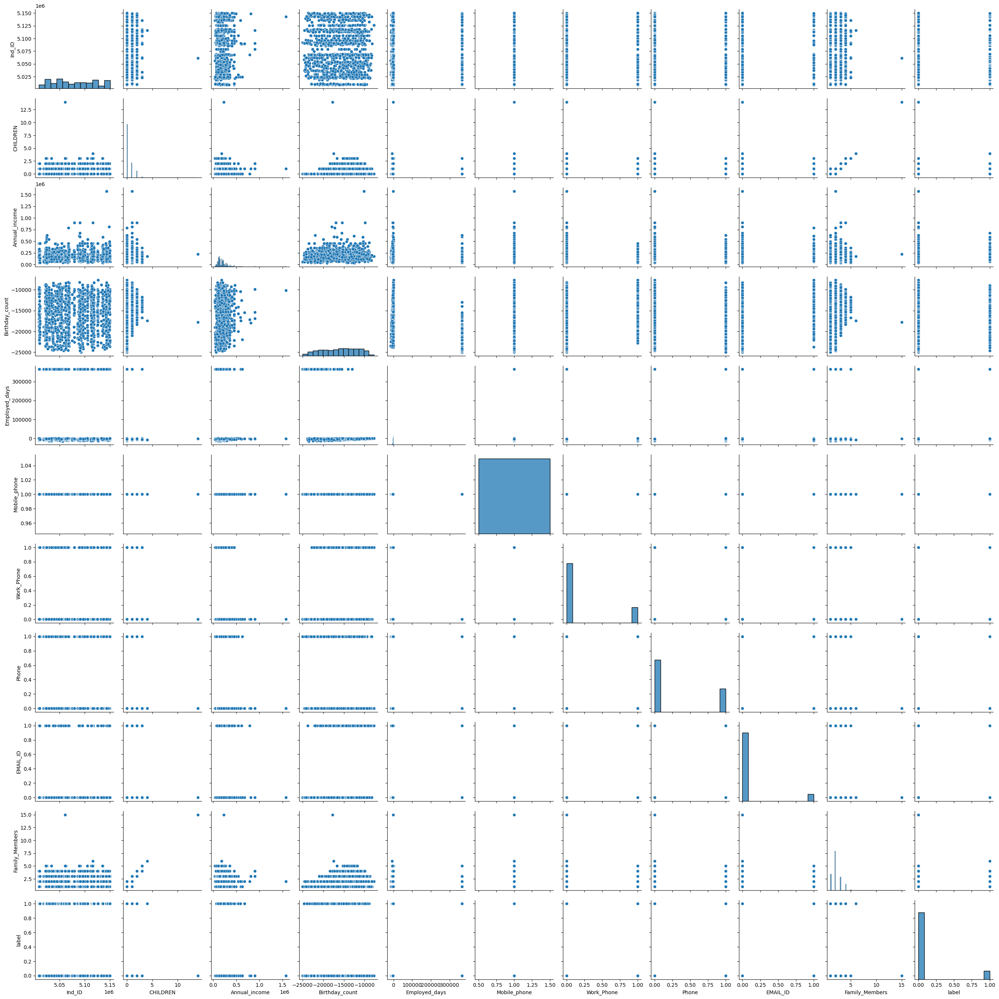

In [14]:
#Pair plot to see the distribution and relationship of variables.
sns.pairplot(df_merged)
plt.show()

In [15]:
#Since the column 'Type_Occupation' has none values, it is important to see whether it can be used for analysis in EDA.
a=px.bar(x=df_merged['Type_Occupation'],y=df_merged['Annual_income'])
a.show()

* Here we can see the number of labourers are the majority and the group as a whole have the highest income.

In [16]:
df_merged

,Ind_ID,GENDER,Car_Owner,Propert_Owner,CHILDREN,Annual_income,Type_Income,EDUCATION,Marital_status,Housing_type,Birthday_count,Employed_days,Mobile_phone,Work_Phone,Phone,EMAIL_ID,Type_Occupation,Family_Members,label
0,5008827,M,Y,Y,0,180000.0,Pensioner,Higher education,Married,House / apartment,-18772.0,365243,1,0,0,0,NaN,2,1
1,5009744,F,Y,N,0,315000.0,Commercial associate,Higher education,Married,House / apartment,-13557.0,-586,1,1,1,0,NaN,2,1
2,5009746,F,Y,N,0,315000.0,Commercial associate,Higher education,Married,House / apartment,NaN,-586,1,1,1,0,NaN,2,1
3,5009749,F,Y,N,0,NaN,Commercial associate,Higher education,Married,House / apartment,-13557.0,-586,1,1,1,0,NaN,2,1
4,5009752,F,Y,N,0,315000.0,Commercial associate,Higher education,Married,House / apartment,-13557.0,-586,1,1,1,0,NaN,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1543,5028645,F,N,Y,0,NaN,Commercial associate,Higher education,Married,House / apartment,-11957.0,-2182,1,0,0,0,Managers,2,0
1544,5023655,F,N,N,0,225000.0,Commercial associate,Incomplete higher,Single / not married,House / apartment,-10229.0,-1209,1,0,0,0,Accountants,1,0
1545,5115992,M,Y,Y,2,180000.0,Working,Higher education,Married,House / apartment,-13174.0,-2477,1,0,0,0,Managers,4,0
1546,5118219,M,Y,N,0,270000.0,Working,Secondary / secondary special,Civil marriage,House / apartment,-15292.0,-645,1,1,1,0,Drivers,2,0


In [17]:
#Filling missing values with mode and mean for respective categorical and continuous feature.
df_merged['GENDER'].fillna(df_merged['GENDER'].mode().iloc[0],inplace=True)
df_merged['Annual_income'].fillna(df_merged['Annual_income'].mean(),inplace=True)

In [18]:
df_merged

,Ind_ID,GENDER,Car_Owner,Propert_Owner,CHILDREN,Annual_income,Type_Income,EDUCATION,Marital_status,Housing_type,Birthday_count,Employed_days,Mobile_phone,Work_Phone,Phone,EMAIL_ID,Type_Occupation,Family_Members,label
0,5008827,M,Y,Y,0,180000.00000,Pensioner,Higher education,Married,House / apartment,-18772.0,365243,1,0,0,0,NaN,2,1
1,5009744,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,-13557.0,-586,1,1,1,0,NaN,2,1
2,5009746,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,NaN,-586,1,1,1,0,NaN,2,1
3,5009749,F,Y,N,0,191399.32623,Commercial associate,Higher education,Married,House / apartment,-13557.0,-586,1,1,1,0,NaN,2,1
4,5009752,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,-13557.0,-586,1,1,1,0,NaN,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1543,5028645,F,N,Y,0,191399.32623,Commercial associate,Higher education,Married,House / apartment,-11957.0,-2182,1,0,0,0,Managers,2,0
1544,5023655,F,N,N,0,225000.00000,Commercial associate,Incomplete higher,Single / not married,House / apartment,-10229.0,-1209,1,0,0,0,Accountants,1,0
1545,5115992,M,Y,Y,2,180000.00000,Working,Higher education,Married,House / apartment,-13174.0,-2477,1,0,0,0,Managers,4,0
1546,5118219,M,Y,N,0,270000.00000,Working,Secondary / secondary special,Civil marriage,House / apartment,-15292.0,-645,1,1,1,0,Drivers,2,0


In [19]:
#Converting 'Birthday_count' into 'Age' and filling the missing values.
df_merged['Birthday_count']=np.abs(df_merged['Birthday_count']/365)
df_merged.rename(columns={'Birthday_count':'Age'},inplace=True)
df_merged['Age'].fillna(df_merged['Age'].mean(),inplace=True)

In [20]:
df_merged.isnull().sum()


Ind_ID               0
GENDER               0
Car_Owner            0
Propert_Owner        0
CHILDREN             0
Annual_income        0
Type_Income          0
EDUCATION            0
Marital_status       0
Housing_type         0
Age                  0
Employed_days        0
Mobile_phone         0
Work_Phone           0
Phone                0
EMAIL_ID             0
Type_Occupation    488
Family_Members       0
label                0
dtype: int64

### Here it is important to keep Type_Occupation feature for some preliminary analysis of the data.

In [21]:
df_merged.describe()

,Ind_ID,CHILDREN,Annual_income,Age,Employed_days,Mobile_phone,Work_Phone,Phone,EMAIL_ID,Family_Members,label
count,1.548000e+03,1548.000000,1.548000e+03,1548.000000,1548.000000,1548.0,1548.000000,1548.000000,1548.000000,1548.000000,1548.000000
mean,5.078920e+06,0.412791,1.913993e+05,43.946143,59364.689922,1.0,0.208010,0.309432,0.092377,2.161499,0.113049
std,4.171759e+04,0.776691,1.124080e+05,11.504990,137808.062701,0.0,0.406015,0.462409,0.289651,0.947772,0.316755
min,5.008827e+06,0.000000,3.375000e+04,21.109589,-14887.000000,1.0,0.000000,0.000000,0.000000,1.000000,0.000000
25%,5.045070e+06,0.000000,1.215000e+05,34.200000,-3174.500000,1.0,0.000000,0.000000,0.000000,2.000000,0.000000
50%,5.078842e+06,0.000000,1.710000e+05,43.327397,-1565.000000,1.0,0.000000,0.000000,0.000000,2.000000,0.000000
75%,5.115673e+06,1.000000,2.250000e+05,53.358904,-431.750000,1.0,0.000000,1.000000,0.000000,3.000000,0.000000
max,5.150412e+06,14.000000,1.575000e+06,68.345205,365243.000000,1.0,1.000000,1.000000,1.000000,15.000000,1.000000


In [22]:
df_merged

,Ind_ID,GENDER,Car_Owner,Propert_Owner,CHILDREN,Annual_income,Type_Income,EDUCATION,Marital_status,Housing_type,Age,Employed_days,Mobile_phone,Work_Phone,Phone,EMAIL_ID,Type_Occupation,Family_Members,label
0,5008827,M,Y,Y,0,180000.00000,Pensioner,Higher education,Married,House / apartment,51.430137,365243,1,0,0,0,NaN,2,1
1,5009744,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,-586,1,1,1,0,NaN,2,1
2,5009746,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,43.946143,-586,1,1,1,0,NaN,2,1
3,5009749,F,Y,N,0,191399.32623,Commercial associate,Higher education,Married,House / apartment,37.142466,-586,1,1,1,0,NaN,2,1
4,5009752,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,-586,1,1,1,0,NaN,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1543,5028645,F,N,Y,0,191399.32623,Commercial associate,Higher education,Married,House / apartment,32.758904,-2182,1,0,0,0,Managers,2,0
1544,5023655,F,N,N,0,225000.00000,Commercial associate,Incomplete higher,Single / not married,House / apartment,28.024658,-1209,1,0,0,0,Accountants,1,0
1545,5115992,M,Y,Y,2,180000.00000,Working,Higher education,Married,House / apartment,36.093151,-2477,1,0,0,0,Managers,4,0
1546,5118219,M,Y,N,0,270000.00000,Working,Secondary / secondary special,Civil marriage,House / apartment,41.895890,-645,1,1,1,0,Drivers,2,0


In [23]:
#Again the 'Employed_days' is converted to work_experience
df_merged['Employed_days']=df_merged['Employed_days']/-365
df_merged.rename(columns={'Employed_days':'work_experience'},inplace=True)

In [24]:
#Iterating the columns to see the values in each object datatype feature.
for col in df_merged.describe(include='object').columns:
    print(col)
    print(df_merged[col].unique())
    print('-'* 100)

GENDER
['M' 'F']
----------------------------------------------------------------------------------------------------
Car_Owner
['Y' 'N']
----------------------------------------------------------------------------------------------------
Propert_Owner
['Y' 'N']
----------------------------------------------------------------------------------------------------
Type_Income
['Pensioner' 'Commercial associate' 'Working' 'State servant']
----------------------------------------------------------------------------------------------------
EDUCATION
['Higher education' 'Secondary / secondary special' 'Lower secondary'
 'Incomplete higher' 'Academic degree']
----------------------------------------------------------------------------------------------------
Marital_status
['Married' 'Single / not married' 'Civil marriage' 'Separated' 'Widow']
----------------------------------------------------------------------------------------------------
Housing_type
['House / apartment' 'With parents' 'R

In [25]:
#Checking the Outliers in each column by iterating and plotting the box plot.
for col in df_merged.columns:
    fig = px.box(df_merged, y=col)
    fig.update_layout(yaxis_title=col)  # Set the Y-axis label
    fig.show()


In [26]:
df_merged

,Ind_ID,GENDER,Car_Owner,Propert_Owner,CHILDREN,Annual_income,Type_Income,EDUCATION,Marital_status,Housing_type,Age,work_experience,Mobile_phone,Work_Phone,Phone,EMAIL_ID,Type_Occupation,Family_Members,label
0,5008827,M,Y,Y,0,180000.00000,Pensioner,Higher education,Married,House / apartment,51.430137,-1000.665753,1,0,0,0,NaN,2,1
1,5009744,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,1,1,1,0,NaN,2,1
2,5009746,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,43.946143,1.605479,1,1,1,0,NaN,2,1
3,5009749,F,Y,N,0,191399.32623,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,1,1,1,0,NaN,2,1
4,5009752,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,1,1,1,0,NaN,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1543,5028645,F,N,Y,0,191399.32623,Commercial associate,Higher education,Married,House / apartment,32.758904,5.978082,1,0,0,0,Managers,2,0
1544,5023655,F,N,N,0,225000.00000,Commercial associate,Incomplete higher,Single / not married,House / apartment,28.024658,3.312329,1,0,0,0,Accountants,1,0
1545,5115992,M,Y,Y,2,180000.00000,Working,Higher education,Married,House / apartment,36.093151,6.786301,1,0,0,0,Managers,4,0
1546,5118219,M,Y,N,0,270000.00000,Working,Secondary / secondary special,Civil marriage,House / apartment,41.895890,1.767123,1,1,1,0,Drivers,2,0


## outlier treatment

In [27]:
# Two columns have outliers.
q1=df_merged['Annual_income'].quantile(0.25)
q3=df_merged['Annual_income'].quantile(0.75)
iqr=q3-q1
u_l=q3+(iqr*1.5)
l_l=q1-(iqr*1.5)
df_merged[(df_merged['Annual_income']<l_l)|(df_merged['Annual_income']>u_l)]



,Ind_ID,GENDER,Car_Owner,Propert_Owner,CHILDREN,Annual_income,Type_Income,EDUCATION,Marital_status,Housing_type,Age,work_experience,Mobile_phone,Work_Phone,Phone,EMAIL_ID,Type_Occupation,Family_Members,label
8,5010864,M,Y,Y,1,450000.0,Commercial associate,Secondary / secondary special,Married,House / apartment,49.789041,1.857534,1,0,1,1,Core staff,3,1
9,5010868,M,Y,Y,1,450000.0,Pensioner,Secondary / secondary special,Married,House / apartment,49.789041,1.857534,1,0,1,1,Core staff,3,1
10,5010869,M,Y,Y,1,450000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,49.789041,1.857534,1,0,1,1,Core staff,1,1
14,5021303,M,N,N,1,472500.0,Pensioner,Higher education,Married,With parents,24.402740,2.501370,1,0,0,1,NaN,3,1
25,5024213,F,Y,Y,0,540000.0,Commercial associate,Higher education,Married,House / apartment,43.019178,0.506849,1,0,1,0,NaN,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1457,5095423,M,Y,Y,0,405000.0,Working,Higher education,Married,House / apartment,32.117808,5.013699,1,1,0,1,NaN,2,0
1467,5113401,M,Y,Y,0,450000.0,Commercial associate,Higher education,Single / not married,House / apartment,29.690411,1.610959,1,0,0,1,Sales staff,1,0
1479,5126562,F,N,N,0,450000.0,Working,Higher education,Married,House / apartment,30.361644,9.208219,1,0,0,0,Sales staff,2,0
1495,5090302,F,N,Y,0,405000.0,Commercial associate,Secondary / secondary special,Married,House / apartment,47.745205,13.353425,1,0,0,1,Sales staff,2,0


In [28]:
# replacing outliers          
df_merged["Annual_income"] = df_merged["Annual_income"].clip(lower=l_l,upper=u_l)

In [29]:
q1=df_merged['work_experience'].quantile(0.25)
q3=df_merged['work_experience'].quantile(0.75)
iqr=q3-q1
u_l=q3+(iqr*1.5)
l_l=q1-(iqr*1.5)
df_merged[(df_merged['work_experience']<l_l)|(df_merged['work_experience']>u_l)]

,Ind_ID,GENDER,Car_Owner,Propert_Owner,CHILDREN,Annual_income,Type_Income,EDUCATION,Marital_status,Housing_type,Age,work_experience,Mobile_phone,Work_Phone,Phone,EMAIL_ID,Type_Occupation,Family_Members,label
0,5008827,M,Y,Y,0,180000.00000,Pensioner,Higher education,Married,House / apartment,51.430137,-1000.665753,1,0,0,0,NaN,2,1
7,5009894,F,N,N,0,180000.00000,Pensioner,Secondary / secondary special,Married,House / apartment,60.641096,-1000.665753,1,0,0,0,NaN,2,1
26,5024916,F,N,Y,0,112500.00000,Pensioner,Secondary / secondary special,Married,House / apartment,59.813699,-1000.665753,1,0,1,0,NaN,2,1
27,5024917,F,N,Y,0,191399.32623,Pensioner,Secondary / secondary special,Married,House / apartment,59.813699,-1000.665753,1,0,1,0,NaN,2,1
31,5029311,F,N,Y,0,112500.00000,Pensioner,Secondary / secondary special,Married,House / apartment,59.934247,-1000.665753,1,0,1,1,NaN,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1509,5024077,F,Y,Y,0,157500.00000,Pensioner,Secondary / secondary special,Widow,House / apartment,55.978082,-1000.665753,1,0,0,0,NaN,1,0
1511,5053535,F,N,Y,0,216000.00000,Pensioner,Higher education,Single / not married,House / apartment,55.857534,-1000.665753,1,0,0,0,NaN,1,0
1514,5051097,F,N,N,0,69750.00000,Pensioner,Secondary / secondary special,Widow,Municipal apartment,60.235616,-1000.665753,1,0,1,0,NaN,1,0
1525,5023719,F,Y,Y,0,175500.00000,Pensioner,Higher education,Married,House / apartment,60.484932,-1000.665753,1,0,1,0,NaN,2,0


In [30]:
# replacing outliers          
df_merged['work_experience'] = df_merged['work_experience'].clip(lower=l_l,upper=u_l) 

In [31]:
# saving the dataframe for sql queries.
df_merged.to_csv(r'C:\Users\ankit\Downloads\file1.csv')

In [32]:
# dropping unnecessary features
df_merged.drop(columns=['Mobile_phone','Work_Phone','Phone','EMAIL_ID'],  axis=1, inplace=True)

### summary statistics

In [33]:
df_merged

,Ind_ID,GENDER,Car_Owner,Propert_Owner,CHILDREN,Annual_income,Type_Income,EDUCATION,Marital_status,Housing_type,Age,work_experience,Type_Occupation,Family_Members,label
0,5008827,M,Y,Y,0,180000.00000,Pensioner,Higher education,Married,House / apartment,51.430137,-10.088699,NaN,2,1
1,5009744,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1
2,5009746,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,43.946143,1.605479,NaN,2,1
3,5009749,F,Y,N,0,191399.32623,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1
4,5009752,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1543,5028645,F,N,Y,0,191399.32623,Commercial associate,Higher education,Married,House / apartment,32.758904,5.978082,Managers,2,0
1544,5023655,F,N,N,0,225000.00000,Commercial associate,Incomplete higher,Single / not married,House / apartment,28.024658,3.312329,Accountants,1,0
1545,5115992,M,Y,Y,2,180000.00000,Working,Higher education,Married,House / apartment,36.093151,6.786301,Managers,4,0
1546,5118219,M,Y,N,0,270000.00000,Working,Secondary / secondary special,Civil marriage,House / apartment,41.895890,1.767123,Drivers,2,0


In [34]:
df_merged.describe(include='all')

,Ind_ID,GENDER,Car_Owner,Propert_Owner,CHILDREN,Annual_income,Type_Income,EDUCATION,Marital_status,Housing_type,Age,work_experience,Type_Occupation,Family_Members,label
count,1.548000e+03,1548,1548,1548,1548.000000,1548.000000,1548,1548,1548,1548,1548.000000,1548.000000,1060,1548.000000,1548.000000
unique,NaN,2,2,2,NaN,NaN,4,5,5,6,NaN,NaN,18,NaN,NaN
top,NaN,F,N,Y,NaN,NaN,Working,Secondary / secondary special,Married,House / apartment,NaN,NaN,Laborers,NaN,NaN
freq,NaN,980,924,1010,NaN,NaN,798,1031,1049,1380,NaN,NaN,268,NaN,NaN
mean,5.078920e+06,NaN,NaN,NaN,0.412791,184537.407625,NaN,NaN,NaN,NaN,43.946143,4.093370,NaN,2.161499,0.113049
std,4.171759e+04,NaN,NaN,NaN,0.776691,82237.507412,NaN,NaN,NaN,NaN,11.504990,8.163866,NaN,0.947772,0.316755
min,5.008827e+06,NaN,NaN,NaN,0.000000,33750.000000,NaN,NaN,NaN,NaN,21.109589,-10.088699,NaN,1.000000,0.000000
25%,5.045070e+06,NaN,NaN,NaN,0.000000,121500.000000,NaN,NaN,NaN,NaN,34.200000,1.182877,NaN,2.000000,0.000000
50%,5.078842e+06,NaN,NaN,NaN,0.000000,171000.000000,NaN,NaN,NaN,NaN,43.327397,4.287671,NaN,2.000000,0.000000
75%,5.115673e+06,NaN,NaN,NaN,1.000000,225000.000000,NaN,NaN,NaN,NaN,53.358904,8.697260,NaN,3.000000,0.000000


## Univariate analysis

In [35]:
for col in df_merged.columns:
    fig=px.histogram(x=df_merged[col])
    fig.update_layout(yaxis_title=col)  # Set the Y-axis label
    fig.show()

* Univariate analysis Observations
- Number of females are a majority in the sample.
- More than 50% of the customers are car owners.
- Also majority of the people have their own property.
- Maximum customers are having 0-1 children.
- Working people form the majority of the sample size.
- Higher Education /Secondary Special are the preferred means of education.
- Most of the people are married.
- Majority of the people are living in House/Apartment.
- Age is nearly equally distributed with max people lying between the age bracket of 40-50.
- The maximum people are having 2-3 family members and are belonging to nuclear families.

### bivariate and multivariate analysis

In [36]:
df_merged.columns

Index(['Ind_ID', 'GENDER', 'Car_Owner', 'Propert_Owner', 'CHILDREN',
       'Annual_income', 'Type_Income', 'EDUCATION', 'Marital_status',
       'Housing_type', 'Age', 'work_experience', 'Type_Occupation',
       'Family_Members', 'label'],
      dtype='object')

In [37]:
df_merged['label'].value_counts(normalize=True)

0    0.886951
1    0.113049
Name: label, dtype: float64

<Axes: >

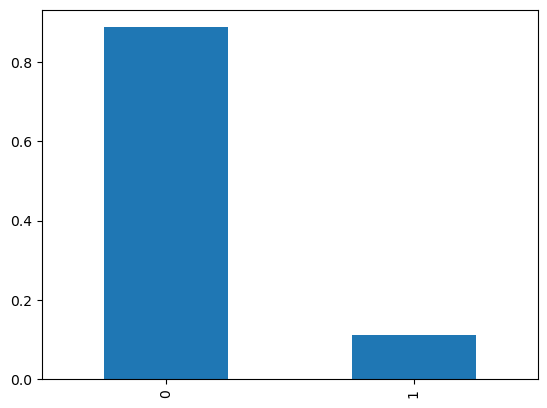

In [38]:
df_merged['label'].value_counts(normalize=True).plot(kind='bar')

* Here we can see that only 11% of the applications are rejected out of the total.

<Axes: >

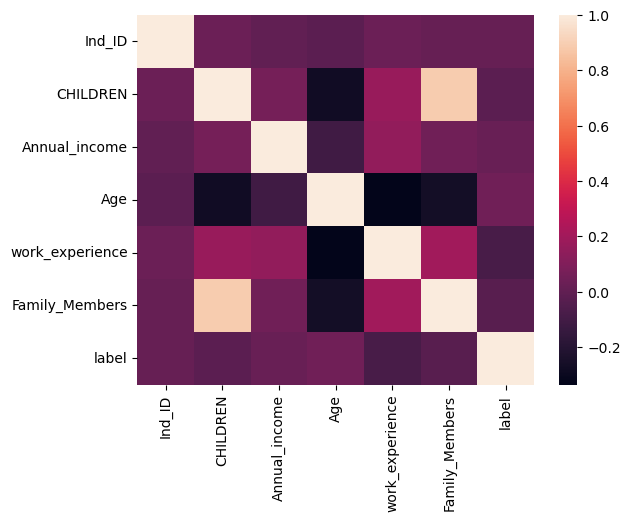

In [39]:
# Seeing the correlation among various features and also with the target variable.
df_merged.corr()
sns.heatmap(df_merged.corr())

In [40]:
df_merged

,Ind_ID,GENDER,Car_Owner,Propert_Owner,CHILDREN,Annual_income,Type_Income,EDUCATION,Marital_status,Housing_type,Age,work_experience,Type_Occupation,Family_Members,label
0,5008827,M,Y,Y,0,180000.00000,Pensioner,Higher education,Married,House / apartment,51.430137,-10.088699,NaN,2,1
1,5009744,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1
2,5009746,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,43.946143,1.605479,NaN,2,1
3,5009749,F,Y,N,0,191399.32623,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1
4,5009752,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1543,5028645,F,N,Y,0,191399.32623,Commercial associate,Higher education,Married,House / apartment,32.758904,5.978082,Managers,2,0
1544,5023655,F,N,N,0,225000.00000,Commercial associate,Incomplete higher,Single / not married,House / apartment,28.024658,3.312329,Accountants,1,0
1545,5115992,M,Y,Y,2,180000.00000,Working,Higher education,Married,House / apartment,36.093151,6.786301,Managers,4,0
1546,5118219,M,Y,N,0,270000.00000,Working,Secondary / secondary special,Civil marriage,House / apartment,41.895890,1.767123,Drivers,2,0


In [41]:
# checking for the comparison of being rejected in terms of gender.
fig=px.bar(df_merged,x='GENDER',y='label')
fig.update_layout(yaxis_title='label')

* We can see the number of females rejected is more than the number of males which is also possible because the number of females is higher in the dataset.

In [42]:
px.bar(x=df_merged['GENDER'],y=df_merged['Annual_income'])

In [43]:
px.bar(x=df_merged['GENDER'],y=df_merged['work_experience'])

* Here we can see that males are having less anamolies in the work experience ie negative experience.

In [44]:
fig=px.bar(df_merged,x='Car_Owner',y='label')
fig.update_layout(yaxis_title='label')

* The majority number of customers rejected for credit card are not car owners, which means it can be considered an asset and shows the financial stability and spending pattern.

In [45]:
px.bar(x=df_merged['Propert_Owner'],y=df_merged['label'])

* Inversely in property owners ,the number of property owners were rejected in majority.

In [46]:
px.bar(x=df_merged['Family_Members'],y=df_merged['label'])

In [47]:
df_merged.head()

,Ind_ID,GENDER,Car_Owner,Propert_Owner,CHILDREN,Annual_income,Type_Income,EDUCATION,Marital_status,Housing_type,Age,work_experience,Type_Occupation,Family_Members,label
0,5008827,M,Y,Y,0,180000.00000,Pensioner,Higher education,Married,House / apartment,51.430137,-10.088699,NaN,2,1
1,5009744,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1
2,5009746,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,43.946143,1.605479,NaN,2,1
3,5009749,F,Y,N,0,191399.32623,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1
4,5009752,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1


In [48]:
px.bar(x=df_merged['Housing_type'],y=df_merged['label'])

In [49]:
px.bar(x=df_merged['Marital_status'],y=df_merged['label'])

In [50]:
px.bar(x=df_merged['Type_Income'],y=df_merged['label'])

In [51]:
px.bar(x=df_merged['Car_Owner'],y=df_merged['Annual_income'])

* The number of car owners and their income is not directly proportional.

In [52]:
px.bar(x=df_merged['Propert_Owner'],y=df_merged['Annual_income'])

* The annual income and the property owners are directly proportional.

In [53]:
df_merged.head()

,Ind_ID,GENDER,Car_Owner,Propert_Owner,CHILDREN,Annual_income,Type_Income,EDUCATION,Marital_status,Housing_type,Age,work_experience,Type_Occupation,Family_Members,label
0,5008827,M,Y,Y,0,180000.00000,Pensioner,Higher education,Married,House / apartment,51.430137,-10.088699,NaN,2,1
1,5009744,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1
2,5009746,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,43.946143,1.605479,NaN,2,1
3,5009749,F,Y,N,0,191399.32623,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1
4,5009752,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1


In [54]:
px.scatter(x=df_merged['Age'],y=df_merged['Annual_income'])

In [55]:
px.scatter(x=df_merged['work_experience'],y=df_merged['Annual_income'])

In [56]:
df_merged.head()

,Ind_ID,GENDER,Car_Owner,Propert_Owner,CHILDREN,Annual_income,Type_Income,EDUCATION,Marital_status,Housing_type,Age,work_experience,Type_Occupation,Family_Members,label
0,5008827,M,Y,Y,0,180000.00000,Pensioner,Higher education,Married,House / apartment,51.430137,-10.088699,NaN,2,1
1,5009744,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1
2,5009746,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,43.946143,1.605479,NaN,2,1
3,5009749,F,Y,N,0,191399.32623,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1
4,5009752,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1


<Axes: xlabel='Age', ylabel='Annual_income'>

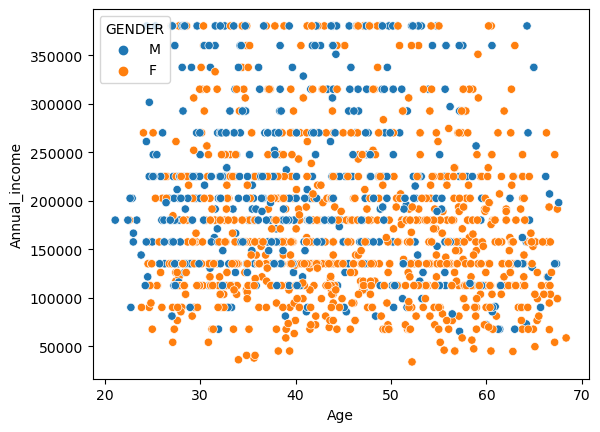

In [57]:
sns.scatterplot(data=df_merged,y='Annual_income',x='Age',hue='GENDER',legend='auto')

* The concentration of females who are older than 40 and having comparatively lower income is higher, whereas males are earning better in the particular age group.

<Axes: xlabel='Age', ylabel='Annual_income'>

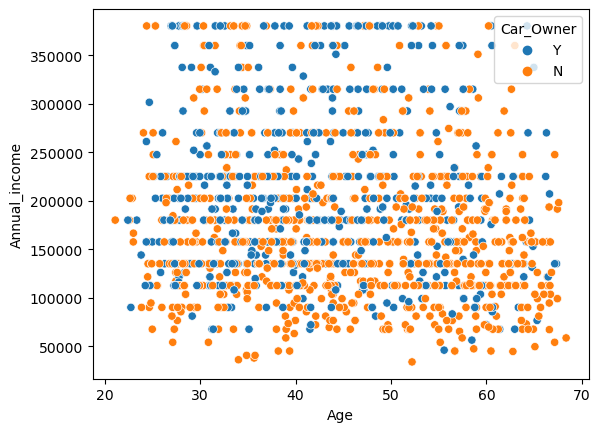

In [58]:
sns.scatterplot(data=df_merged,y='Annual_income',x='Age',hue='Car_Owner')

* In the higher segments of income people generally are car owners.

<Axes: xlabel='Age', ylabel='Annual_income'>

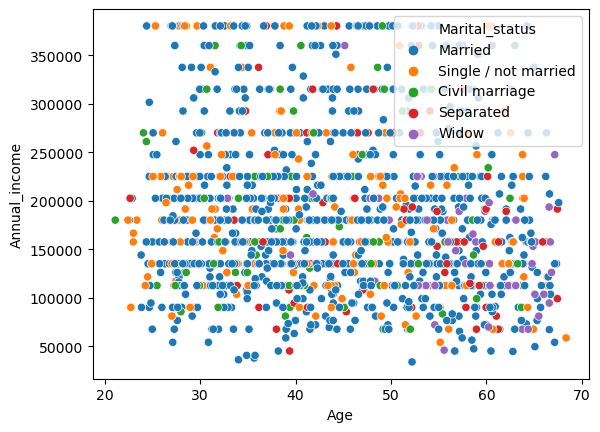

In [59]:
sns.scatterplot(data=df_merged,y='Annual_income',x='Age',hue='Marital_status',legend='brief')

In [60]:
plt.figure(figsize=(15, 10))
px.bar(df_merged,x='Type_Income',y='label',color='GENDER')


<Figure size 1500x1000 with 0 Axes>

* In the type income the maximum number of customers are lying in the working group and the males are having more approval than denial of cards.
* In the other type of incomes males are dominating by a great margin.

In [61]:
df_merged.head()

,Ind_ID,GENDER,Car_Owner,Propert_Owner,CHILDREN,Annual_income,Type_Income,EDUCATION,Marital_status,Housing_type,Age,work_experience,Type_Occupation,Family_Members,label
0,5008827,M,Y,Y,0,180000.00000,Pensioner,Higher education,Married,House / apartment,51.430137,-10.088699,NaN,2,1
1,5009744,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1
2,5009746,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,43.946143,1.605479,NaN,2,1
3,5009749,F,Y,N,0,191399.32623,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1
4,5009752,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1


In [62]:
count_zeros = (df_merged[df_merged['label'] == 0])

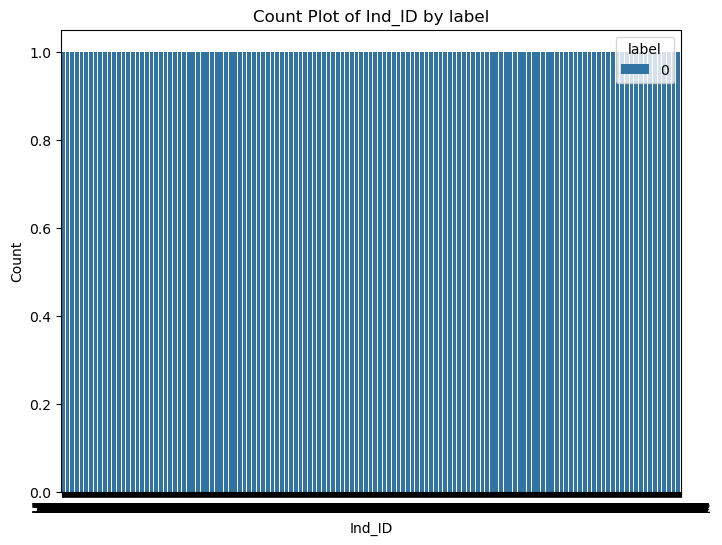

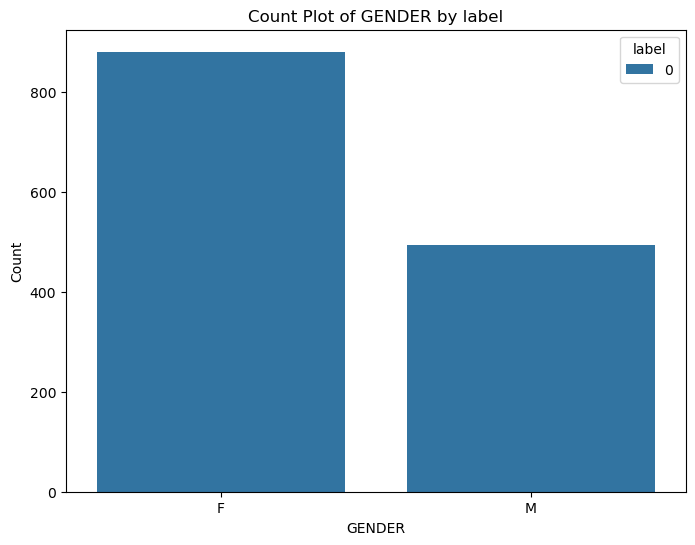

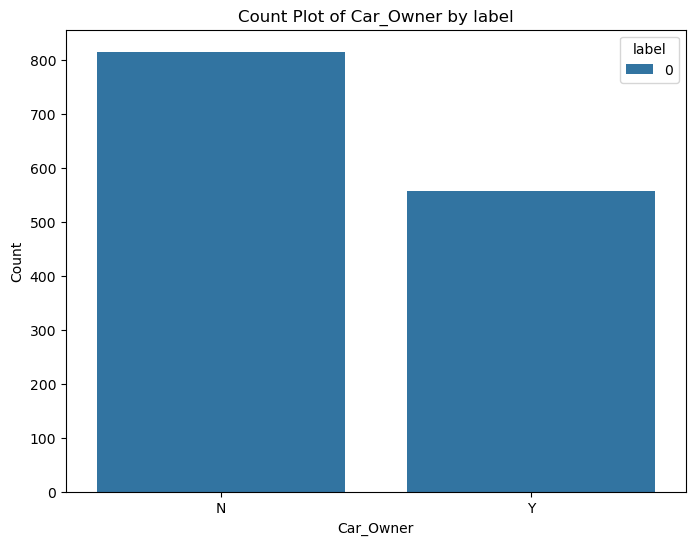

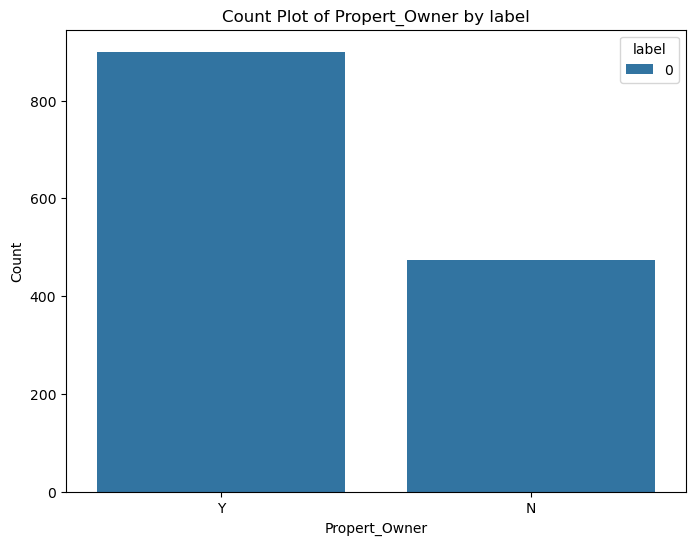

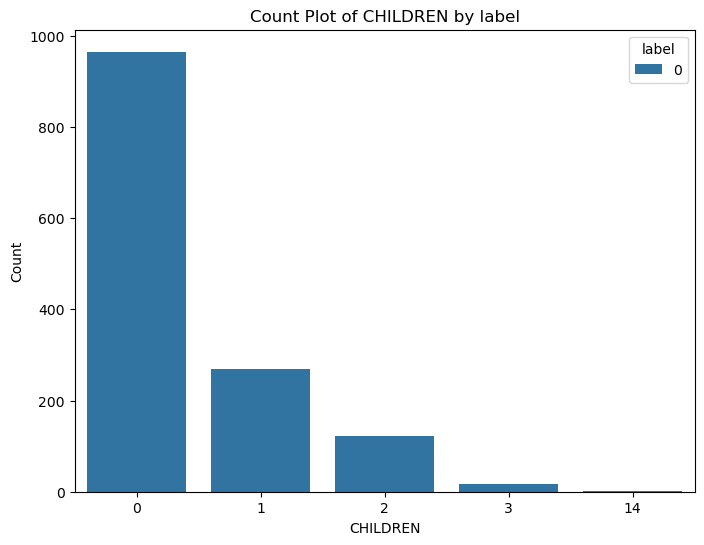

...

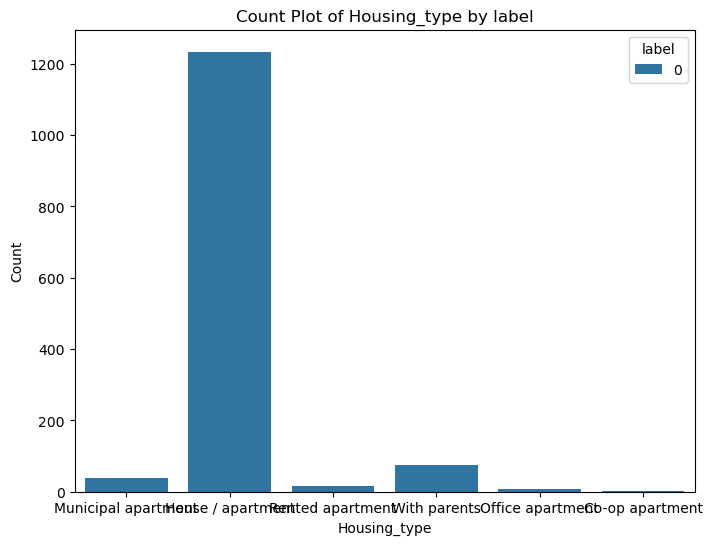

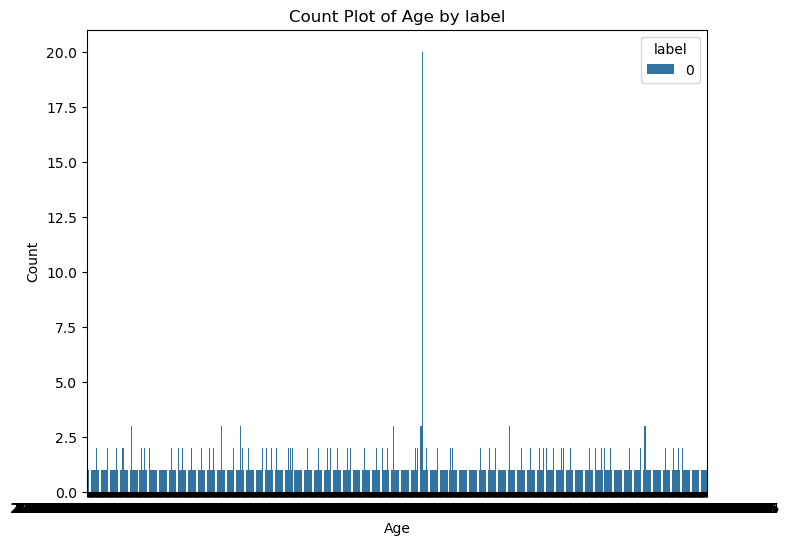

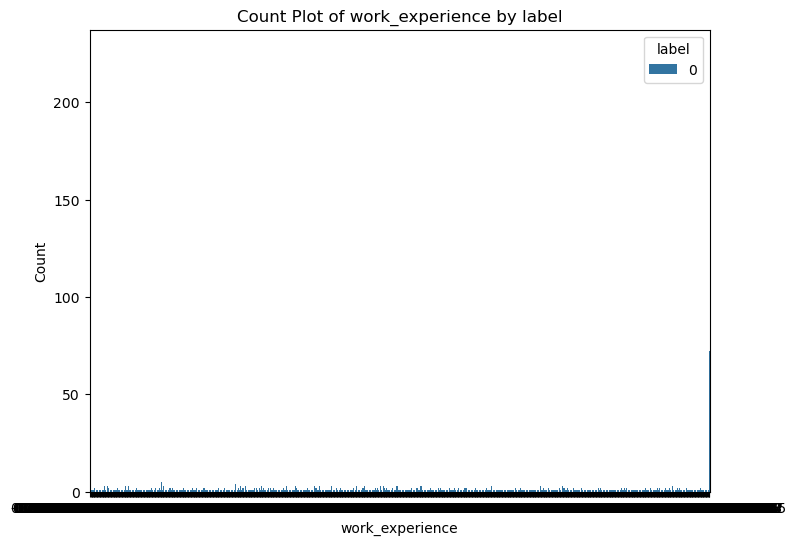

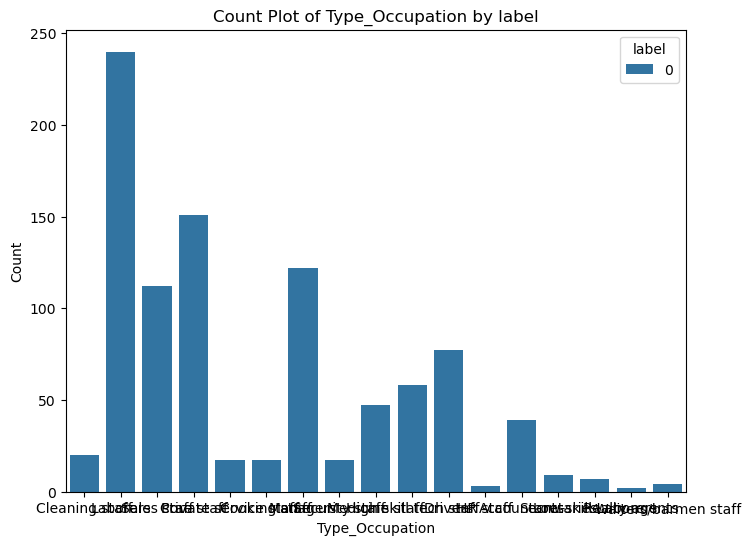

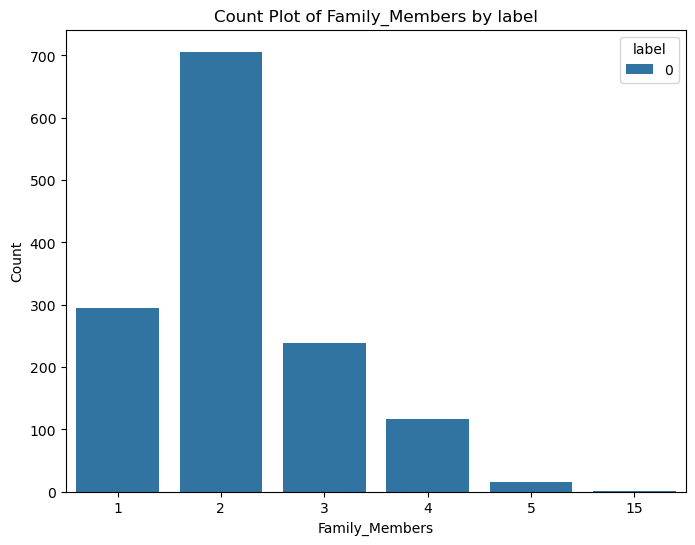

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a DataFrame count_zeros with columns and a 'label' column

# Loop through columns
for col in count_zeros.columns:
    if col != 'label':  # Exclude the 'label' column
        # Create a count plot
        fig, ax = plt.subplots(figsize=(8, 6))
        sns.countplot(data=count_zeros, x=col, hue='label', ax=ax)
        
        # Customize the plot
        plt.xlabel(col)
        plt.ylabel('Count')
        plt.title(f'Count Plot of {col} by label')
        
        # Show the plot
        plt.show()


### Insights
* We can see here that customers having property and 2 children can be a potential good customer with financial stability and can be targeted the most as the likelihood of them being approved is the most. 

In [64]:
df_merged.head()

,Ind_ID,GENDER,Car_Owner,Propert_Owner,CHILDREN,Annual_income,Type_Income,EDUCATION,Marital_status,Housing_type,Age,work_experience,Type_Occupation,Family_Members,label
0,5008827,M,Y,Y,0,180000.00000,Pensioner,Higher education,Married,House / apartment,51.430137,-10.088699,NaN,2,1
1,5009744,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1
2,5009746,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,43.946143,1.605479,NaN,2,1
3,5009749,F,Y,N,0,191399.32623,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1
4,5009752,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1


In [65]:
fig = px.histogram(df_merged, x='GENDER', color='label',
                   title='Histogram of "label" by Gender')

# Show the plot
fig.show()

* The number of males whose credit card got approved is higher than those of female whereas the number of females whose application got rejected are in majority giving us the clarity that males are more financially stable and with some added independent features can be considered good customers.
* This also brings us to the fact that the bank needs to analyze the female customers to find out how can they include females in the credit card market.

## Feature Encoding

In [66]:
df_merged.head()

,Ind_ID,GENDER,Car_Owner,Propert_Owner,CHILDREN,Annual_income,Type_Income,EDUCATION,Marital_status,Housing_type,Age,work_experience,Type_Occupation,Family_Members,label
0,5008827,M,Y,Y,0,180000.00000,Pensioner,Higher education,Married,House / apartment,51.430137,-10.088699,NaN,2,1
1,5009744,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1
2,5009746,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,43.946143,1.605479,NaN,2,1
3,5009749,F,Y,N,0,191399.32623,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1
4,5009752,F,Y,N,0,315000.00000,Commercial associate,Higher education,Married,House / apartment,37.142466,1.605479,NaN,2,1


In [67]:
#dropping the column for machine learning to work properly.
df_merged.drop(['Type_Occupation'],axis=1,inplace=True)

In [68]:
#Dummy Encoding for the categorical features.
df_merged=pd.get_dummies(df_merged,columns=['GENDER','Car_Owner','Propert_Owner','Type_Income','Marital_status',
                                  'Housing_type'],drop_first=True)

In [69]:
df_merged.head()

,Ind_ID,CHILDREN,Annual_income,EDUCATION,Age,work_experience,Family_Members,label,GENDER_M,Car_Owner_Y,...,Type_Income_Working,Marital_status_Married,Marital_status_Separated,Marital_status_Single / not married,Marital_status_Widow,Housing_type_House / apartment,Housing_type_Municipal apartment,Housing_type_Office apartment,Housing_type_Rented apartment,Housing_type_With parents
0,5008827,0,180000.00000,Higher education,51.430137,-10.088699,2,1,1,1,...,0,1,0,0,0,1,0,0,0,0
1,5009744,0,315000.00000,Higher education,37.142466,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0
2,5009746,0,315000.00000,Higher education,43.946143,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0
3,5009749,0,191399.32623,Higher education,37.142466,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0
4,5009752,0,315000.00000,Higher education,37.142466,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0


In [70]:
df_merged.columns

Index(['Ind_ID', 'CHILDREN', 'Annual_income', 'EDUCATION', 'Age',
       'work_experience', 'Family_Members', 'label', 'GENDER_M', 'Car_Owner_Y',
       'Propert_Owner_Y', 'Type_Income_Pensioner', 'Type_Income_State servant',
       'Type_Income_Working', 'Marital_status_Married',
       'Marital_status_Separated', 'Marital_status_Single / not married',
       'Marital_status_Widow', 'Housing_type_House / apartment',
       'Housing_type_Municipal apartment', 'Housing_type_Office apartment',
       'Housing_type_Rented apartment', 'Housing_type_With parents'],
      dtype='object')

In [71]:
#Since Education is an ordinal feature, LabelEncoder can be used which assigns a number to the feature.
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df_merged['EDUCATION'] = label_encoder.fit_transform(df_merged['EDUCATION'])


In [72]:
df_merged.head()

,Ind_ID,CHILDREN,Annual_income,EDUCATION,Age,work_experience,Family_Members,label,GENDER_M,Car_Owner_Y,...,Type_Income_Working,Marital_status_Married,Marital_status_Separated,Marital_status_Single / not married,Marital_status_Widow,Housing_type_House / apartment,Housing_type_Municipal apartment,Housing_type_Office apartment,Housing_type_Rented apartment,Housing_type_With parents
0,5008827,0,180000.00000,1,51.430137,-10.088699,2,1,1,1,...,0,1,0,0,0,1,0,0,0,0
1,5009744,0,315000.00000,1,37.142466,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0
2,5009746,0,315000.00000,1,43.946143,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0
3,5009749,0,191399.32623,1,37.142466,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0
4,5009752,0,315000.00000,1,37.142466,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0


In [73]:
df_merged.head()

,Ind_ID,CHILDREN,Annual_income,EDUCATION,Age,work_experience,Family_Members,label,GENDER_M,Car_Owner_Y,...,Type_Income_Working,Marital_status_Married,Marital_status_Separated,Marital_status_Single / not married,Marital_status_Widow,Housing_type_House / apartment,Housing_type_Municipal apartment,Housing_type_Office apartment,Housing_type_Rented apartment,Housing_type_With parents
0,5008827,0,180000.00000,1,51.430137,-10.088699,2,1,1,1,...,0,1,0,0,0,1,0,0,0,0
1,5009744,0,315000.00000,1,37.142466,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0
2,5009746,0,315000.00000,1,43.946143,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0
3,5009749,0,191399.32623,1,37.142466,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0
4,5009752,0,315000.00000,1,37.142466,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0


## Feature Selection

In [74]:
df_merged.head()

,Ind_ID,CHILDREN,Annual_income,EDUCATION,Age,work_experience,Family_Members,label,GENDER_M,Car_Owner_Y,...,Type_Income_Working,Marital_status_Married,Marital_status_Separated,Marital_status_Single / not married,Marital_status_Widow,Housing_type_House / apartment,Housing_type_Municipal apartment,Housing_type_Office apartment,Housing_type_Rented apartment,Housing_type_With parents
0,5008827,0,180000.00000,1,51.430137,-10.088699,2,1,1,1,...,0,1,0,0,0,1,0,0,0,0
1,5009744,0,315000.00000,1,37.142466,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0
2,5009746,0,315000.00000,1,43.946143,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0
3,5009749,0,191399.32623,1,37.142466,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0
4,5009752,0,315000.00000,1,37.142466,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0


In [75]:
df_merged.shape

(1548, 23)

In [76]:
df_merged

,Ind_ID,CHILDREN,Annual_income,EDUCATION,Age,work_experience,Family_Members,label,GENDER_M,Car_Owner_Y,...,Type_Income_Working,Marital_status_Married,Marital_status_Separated,Marital_status_Single / not married,Marital_status_Widow,Housing_type_House / apartment,Housing_type_Municipal apartment,Housing_type_Office apartment,Housing_type_Rented apartment,Housing_type_With parents
0,5008827,0,180000.00000,1,51.430137,-10.088699,2,1,1,1,...,0,1,0,0,0,1,0,0,0,0
1,5009744,0,315000.00000,1,37.142466,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0
2,5009746,0,315000.00000,1,43.946143,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0
3,5009749,0,191399.32623,1,37.142466,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0
4,5009752,0,315000.00000,1,37.142466,1.605479,2,1,0,1,...,0,1,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1543,5028645,0,191399.32623,1,32.758904,5.978082,2,0,0,0,...,0,1,0,0,0,1,0,0,0,0
1544,5023655,0,225000.00000,2,28.024658,3.312329,1,0,0,0,...,0,0,0,1,0,1,0,0,0,0
1545,5115992,2,180000.00000,1,36.093151,6.786301,4,0,1,1,...,1,1,0,0,0,1,0,0,0,0
1546,5118219,0,270000.00000,4,41.895890,1.767123,2,0,1,1,...,1,0,0,0,0,1,0,0,0,0


In [77]:
#Splitting the data into dependent feature(y) and independent features(X)
X=df_merged.drop(['label'],axis=1)

In [78]:
y=df_merged['label']

In [79]:
y

0       1
1       1
2       1
3       1
4       1
       ..
1543    0
1544    0
1545    0
1546    0
1547    0
Name: label, Length: 1548, dtype: int64

In [80]:
X

,Ind_ID,CHILDREN,Annual_income,EDUCATION,Age,work_experience,Family_Members,GENDER_M,Car_Owner_Y,Propert_Owner_Y,...,Type_Income_Working,Marital_status_Married,Marital_status_Separated,Marital_status_Single / not married,Marital_status_Widow,Housing_type_House / apartment,Housing_type_Municipal apartment,Housing_type_Office apartment,Housing_type_Rented apartment,Housing_type_With parents
0,5008827,0,180000.00000,1,51.430137,-10.088699,2,1,1,1,...,0,1,0,0,0,1,0,0,0,0
1,5009744,0,315000.00000,1,37.142466,1.605479,2,0,1,0,...,0,1,0,0,0,1,0,0,0,0
2,5009746,0,315000.00000,1,43.946143,1.605479,2,0,1,0,...,0,1,0,0,0,1,0,0,0,0
3,5009749,0,191399.32623,1,37.142466,1.605479,2,0,1,0,...,0,1,0,0,0,1,0,0,0,0
4,5009752,0,315000.00000,1,37.142466,1.605479,2,0,1,0,...,0,1,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1543,5028645,0,191399.32623,1,32.758904,5.978082,2,0,0,1,...,0,1,0,0,0,1,0,0,0,0
1544,5023655,0,225000.00000,2,28.024658,3.312329,1,0,0,0,...,0,0,0,1,0,1,0,0,0,0
1545,5115992,2,180000.00000,1,36.093151,6.786301,4,1,1,1,...,1,1,0,0,0,1,0,0,0,0
1546,5118219,0,270000.00000,4,41.895890,1.767123,2,1,1,0,...,1,0,0,0,0,1,0,0,0,0


## statistical techniques

### Here the target variable is categorical and the independent variables are categorical and continuous.
#### Hence we perform chi2 test and 2 sample t test.

In [81]:
#Here the column 'work_experience' has negative values which needs to be scaled to perform various statistical tests.
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

# Instantiate the Min-Max scaler
scaler = MinMaxScaler()

# Apply the scaler to your feature matrix X
X_scaled = scaler.fit_transform(X[['work_experience']])


In [82]:
#Replacing the old values with the scaled values.
X['work_experience']=X_scaled

In [83]:
X








,Ind_ID,CHILDREN,Annual_income,EDUCATION,Age,work_experience,Family_Members,GENDER_M,Car_Owner_Y,Propert_Owner_Y,...,Type_Income_Working,Marital_status_Married,Marital_status_Separated,Marital_status_Single / not married,Marital_status_Widow,Housing_type_House / apartment,Housing_type_Municipal apartment,Housing_type_Office apartment,Housing_type_Rented apartment,Housing_type_With parents
0,5008827,0,180000.00000,1,51.430137,0.000000,2,1,1,1,...,0,1,0,0,0,1,0,0,0,0
1,5009744,0,315000.00000,1,37.142466,0.389060,2,0,1,0,...,0,1,0,0,0,1,0,0,0,0
2,5009746,0,315000.00000,1,43.946143,0.389060,2,0,1,0,...,0,1,0,0,0,1,0,0,0,0
3,5009749,0,191399.32623,1,37.142466,0.389060,2,0,1,0,...,0,1,0,0,0,1,0,0,0,0
4,5009752,0,315000.00000,1,37.142466,0.389060,2,0,1,0,...,0,1,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1543,5028645,0,191399.32623,1,32.758904,0.534534,2,0,0,1,...,0,1,0,0,0,1,0,0,0,0
1544,5023655,0,225000.00000,2,28.024658,0.445846,1,0,0,0,...,0,0,0,1,0,1,0,0,0,0
1545,5115992,2,180000.00000,1,36.093151,0.561423,4,1,1,1,...,1,1,0,0,0,1,0,0,0,0
1546,5118219,0,270000.00000,4,41.895890,0.394438,2,1,1,0,...,1,0,0,0,0,1,0,0,0,0


In [84]:
# Using chi2 and selectkbest test for feature selection 
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
ranked_features=SelectKBest(score_func=chi2,k=22)
ranked_features=ranked_features.fit(X,y)
ranked_features=pd.DataFrame(ranked_features.scores_,columns=['Score'])
column=pd.DataFrame(X.columns)
ranked_features=pd.concat([column,ranked_features],axis=1)
ranked_features.columns=['Feature','Score']

In [85]:
# ranking features based on their score obtained after chi2.
ranked_features

,Feature,Score
0,Ind_ID,149.550926
1,CHILDREN,1.059291
2,Annual_income,28508.659920
3,EDUCATION,0.670637
4,Age,9.364754
5,work_experience,1.637072
6,Family_Members,0.606296
7,GENDER_M,2.043506
8,Car_Owner_Y,0.200587
9,Propert_Owner_Y,0.172496


In [86]:
ranked_features.nlargest(21,'Score')

,Feature,Score
2,Annual_income,28508.659920
0,Ind_ID,149.550926
18,Housing_type_Municipal apartment,18.848925
4,Age,9.364754
10,Type_Income_Pensioner,4.980035
11,Type_Income_State servant,4.350767
15,Marital_status_Single / not married,3.830908
12,Type_Income_Working,2.181951
7,GENDER_M,2.043506
21,Housing_type_With parents,2.038685


In [87]:
# Again 2 sample t test for selection based on the p value.
from scipy import stats


t_statistic, p_value = stats.ttest_ind(X,y)

# Display the results
print("T-statistic:", t_statistic)
print("P-value:", p_value)


T-statistic: [ 4.79002393e+03  1.40596589e+01  8.82875955e+01  8.39158199e+01
  1.49843119e+02  3.38306581e+01  8.06517740e+01  1.73153672e+01
  1.95397983e+01  3.70995958e+01  4.83665828e+00 -3.64021693e+00
  2.67553394e+01  3.93357832e+01 -5.04278930e+00  2.78288030e+00
 -6.64119630e+00  6.89776357e+01 -8.48912170e+00 -1.29517572e+01
 -1.16066948e+01 -6.24741256e+00]
P-value: [0.00000000e+000 1.43321342e-043 0.00000000e+000 0.00000000e+000
 0.00000000e+000 9.46453723e-214 0.00000000e+000 3.47596363e-064
 2.86800812e-080 1.45948484e-249 1.38491479e-006 2.76867157e-004
 4.89594333e-142 8.66433827e-275 4.85219330e-007 5.42056651e-003
 3.66126985e-011 0.00000000e+000 3.18362499e-017 2.11656117e-037
 1.61869924e-030 4.74418018e-010]


In [88]:
ranked_features1=pd.DataFrame(data=p_value)
column=pd.DataFrame(X.columns)
ranked_features1=pd.concat([column,ranked_features1],axis=1)
ranked_features1.columns=['Feature','P-value']

In [89]:
ranked_features1

,Feature,P-value
0,Ind_ID,0.000000e+00
1,CHILDREN,1.433213e-43
2,Annual_income,0.000000e+00
3,EDUCATION,0.000000e+00
4,Age,0.000000e+00
5,work_experience,9.464537e-214
6,Family_Members,0.000000e+00
7,GENDER_M,3.475964e-64
8,Car_Owner_Y,2.868008e-80
9,Propert_Owner_Y,1.459485e-249


In [90]:
#ranking features based on their p- value.
ranked_features1.nsmallest(22,'P-value')

,Feature,P-value
0,Ind_ID,0.000000e+00
2,Annual_income,0.000000e+00
3,EDUCATION,0.000000e+00
4,Age,0.000000e+00
6,Family_Members,0.000000e+00
17,Housing_type_House / apartment,0.000000e+00
13,Marital_status_Married,8.664338e-275
9,Propert_Owner_Y,1.459485e-249
5,work_experience,9.464537e-214
12,Type_Income_Working,4.895943e-142


In [91]:
ranked_features.nlargest(22,'Score')

,Feature,Score
2,Annual_income,28508.659920
0,Ind_ID,149.550926
18,Housing_type_Municipal apartment,18.848925
4,Age,9.364754
10,Type_Income_Pensioner,4.980035
11,Type_Income_State servant,4.350767
15,Marital_status_Single / not married,3.830908
12,Type_Income_Working,2.181951
7,GENDER_M,2.043506
21,Housing_type_With parents,2.038685


* Here we can see the number of features are very less and their p-value is also very small (less than 0.05),hence for now we can keep all features.

### feature transformation

In [92]:
#checking skewness.
X.skew()

Ind_ID                                  0.072346
CHILDREN                                4.631122
Annual_income                           0.784474
EDUCATION                              -0.810551
Age                                     0.172313
work_experience                        -0.175481
Family_Members                          2.232273
GENDER_M                                0.552753
Car_Owner_Y                             0.395471
Propert_Owner_Y                        -0.640931
Type_Income_Pensioner                   1.723579
Type_Income_State servant               3.232039
Type_Income_Working                    -0.062106
Marital_status_Married                 -0.760932
Marital_status_Separated                3.635481
Marital_status_Single / not married     1.999743
Marital_status_Widow                    4.210138
Housing_type_House / apartment         -2.519588
Housing_type_Municipal apartment        5.127762
Housing_type_Office apartment          13.012838
Housing_type_Rented 

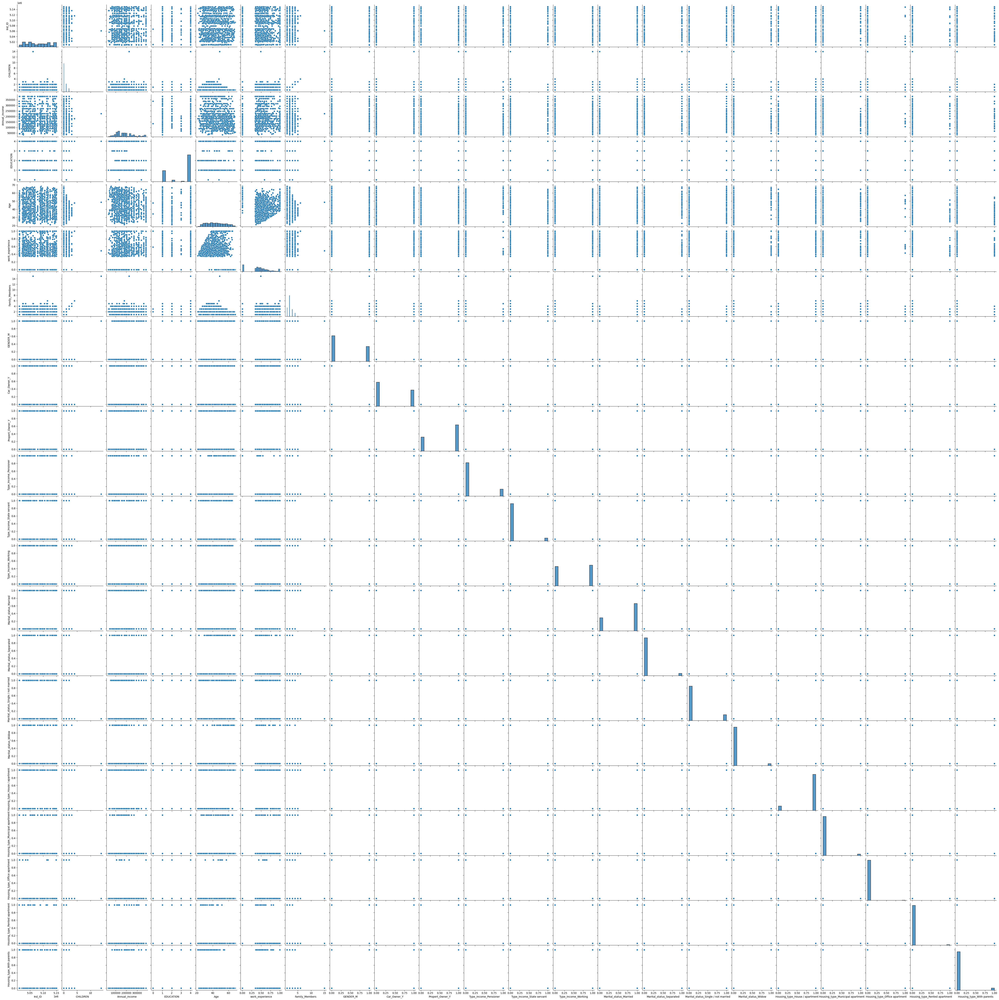

In [93]:
#visualizing the skewness.
sns.pairplot(X)
plt.show()

In [94]:
df=X.iloc[:,1:7]

In [95]:
df

,CHILDREN,Annual_income,EDUCATION,Age,work_experience,Family_Members
0,0,180000.00000,1,51.430137,0.000000,2
1,0,315000.00000,1,37.142466,0.389060,2
2,0,315000.00000,1,43.946143,0.389060,2
3,0,191399.32623,1,37.142466,0.389060,2
4,0,315000.00000,1,37.142466,0.389060,2
...,...,...,...,...,...,...
1543,0,191399.32623,1,32.758904,0.534534,2
1544,0,225000.00000,2,28.024658,0.445846,1
1545,2,180000.00000,1,36.093151,0.561423,4
1546,0,270000.00000,4,41.895890,0.394438,2


CHILDREN
Axes(0.125,0.11;0.775x0.77)


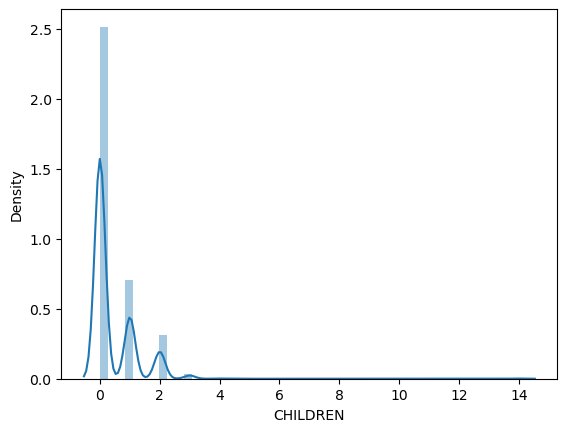

Annual_income
Axes(0.125,0.11;0.775x0.77)


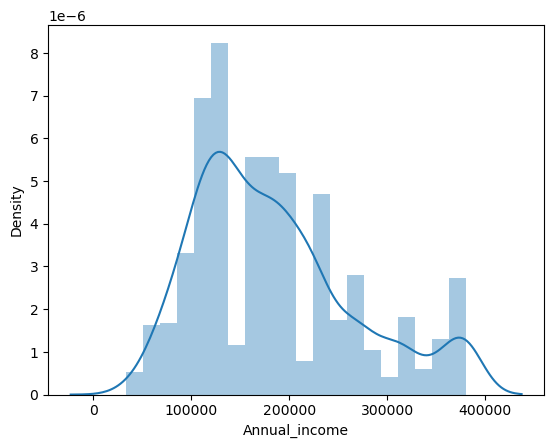

EDUCATION
Axes(0.125,0.11;0.775x0.77)


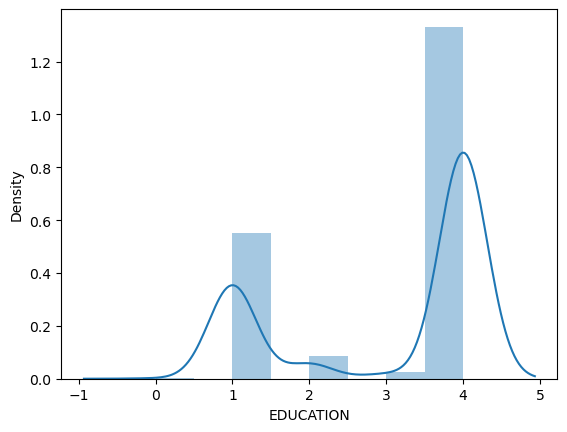

Age
Axes(0.125,0.11;0.775x0.77)


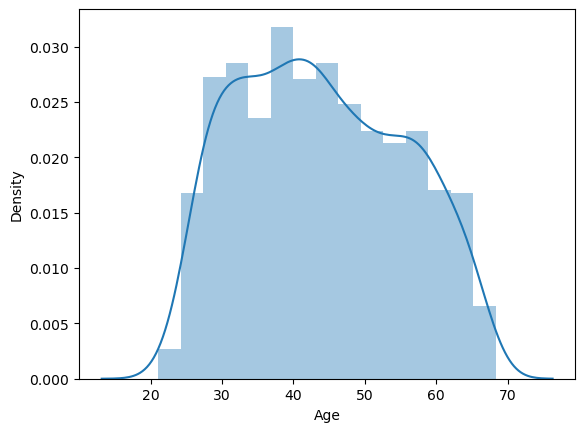

work_experience
Axes(0.125,0.11;0.775x0.77)


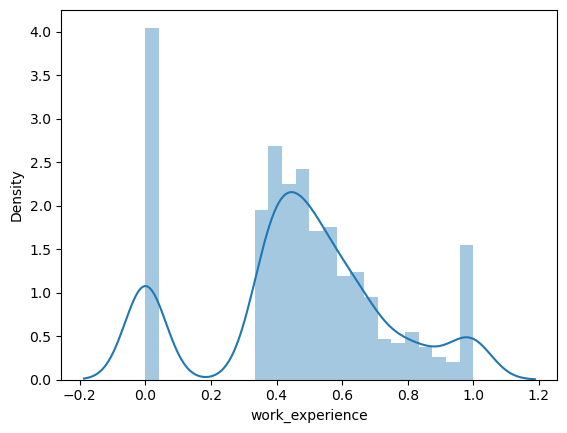

Family_Members
Axes(0.125,0.11;0.775x0.77)


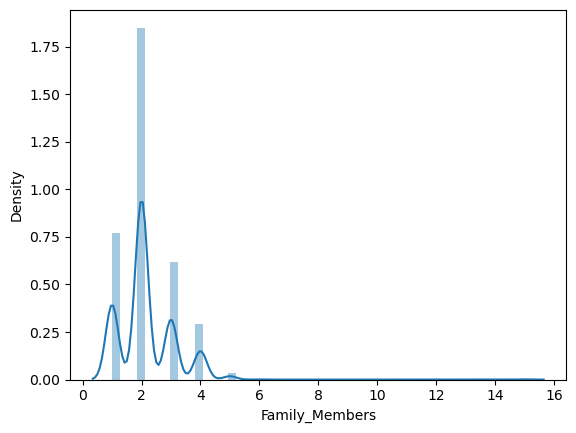

In [96]:
#Also checking the distribution of data.
for col in df.columns:
    print(col)
    print(sns.distplot(df[col]))
    plt.show()

In [97]:
X['CHILDREN'].skew()

4.631121894695182

In [98]:
#here 2 numerical features have right skewed distribution.
#hence performing box-cox transformation.
from scipy import stats
import pandas as pd

# Assuming you have a DataFrame named 'df' and you want to apply Box-Cox transformation to 'column1' and 'column2'

# Add a small constant to make data positive
constant = 1e-8
X['CHILDREN'], _ = stats.boxcox(X['CHILDREN'] + constant)
X['Family_Members'], _ = stats.boxcox(X['Family_Members'] + constant)


In [99]:
X.skew()

Ind_ID                                  0.072346
CHILDREN                                0.898814
Annual_income                           0.784474
EDUCATION                              -0.810551
Age                                     0.172313
work_experience                        -0.175481
Family_Members                         -0.001934
GENDER_M                                0.552753
Car_Owner_Y                             0.395471
Propert_Owner_Y                        -0.640931
Type_Income_Pensioner                   1.723579
Type_Income_State servant               3.232039
Type_Income_Working                    -0.062106
Marital_status_Married                 -0.760932
Marital_status_Separated                3.635481
Marital_status_Single / not married     1.999743
Marital_status_Widow                    4.210138
Housing_type_House / apartment         -2.519588
Housing_type_Municipal apartment        5.127762
Housing_type_Office apartment          13.012838
Housing_type_Rented 

## Spliting into train and test

In [100]:
X

,Ind_ID,CHILDREN,Annual_income,EDUCATION,Age,work_experience,Family_Members,GENDER_M,Car_Owner_Y,Propert_Owner_Y,...,Type_Income_Working,Marital_status_Married,Marital_status_Separated,Marital_status_Single / not married,Marital_status_Widow,Housing_type_House / apartment,Housing_type_Municipal apartment,Housing_type_Office apartment,Housing_type_Rented apartment,Housing_type_With parents
0,5008827,-95.682255,180000.00000,1,51.430137,0.000000,7.283760e-01,1,1,1,...,0,1,0,0,0,1,0,0,0,0
1,5009744,-95.682255,315000.00000,1,37.142466,0.389060,7.283760e-01,0,1,0,...,0,1,0,0,0,1,0,0,0,0
2,5009746,-95.682255,315000.00000,1,43.946143,0.389060,7.283760e-01,0,1,0,...,0,1,0,0,0,1,0,0,0,0
3,5009749,-95.682255,191399.32623,1,37.142466,0.389060,7.283760e-01,0,1,0,...,0,1,0,0,0,1,0,0,0,0
4,5009752,-95.682255,315000.00000,1,37.142466,0.389060,7.283760e-01,0,1,0,...,0,1,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1543,5028645,-95.682255,191399.32623,1,32.758904,0.534534,7.283760e-01,0,0,1,...,0,1,0,0,0,1,0,0,0,0
1544,5023655,-95.682255,225000.00000,2,28.024658,0.445846,1.000000e-08,0,0,0,...,0,0,0,1,0,1,0,0,0,0
1545,5115992,0.658919,180000.00000,1,36.093151,0.561423,1.532024e+00,1,1,1,...,1,1,0,0,0,1,0,0,0,0
1546,5118219,-95.682255,270000.00000,4,41.895890,0.394438,7.283760e-01,1,1,0,...,1,0,0,0,0,1,0,0,0,0


In [101]:
y

0       1
1       1
2       1
3       1
4       1
       ..
1543    0
1544    0
1545    0
1546    0
1547    0
Name: label, Length: 1548, dtype: int64

In [102]:
from sklearn.model_selection import train_test_split

# Assuming you have a feature matrix X and a target variable y
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Parameters:
# X: Your feature matrix
# y: Your target variable
# test_size: The proportion of the dataset to include in the test split (e.g., 0.2 for 20% testing, 0.3 for 30% testing)
# random_state: A seed for the random number generator (for reproducibility)

# X_train: Training features
# X_test: Testing features
# y_train: Training target variable
# y_test: Testing target variable


In [103]:
X_train

,Ind_ID,CHILDREN,Annual_income,EDUCATION,Age,work_experience,Family_Members,GENDER_M,Car_Owner_Y,Propert_Owner_Y,...,Type_Income_Working,Marital_status_Married,Marital_status_Separated,Marital_status_Single / not married,Marital_status_Widow,Housing_type_House / apartment,Housing_type_Municipal apartment,Housing_type_Office apartment,Housing_type_Rented apartment,Housing_type_With parents
1078,5050724,-9.568225e+01,360000.0,1,35.191781,0.544925,7.283760e-01,0,1,0,...,1,1,0,0,0,1,0,0,0,0
1056,5089580,-9.568225e+01,112500.0,4,31.956164,0.377575,7.283760e-01,0,1,0,...,0,1,0,0,0,1,0,0,0,0
1324,5125710,-9.568225e+01,135000.0,3,44.967123,0.392341,7.283760e-01,0,1,1,...,1,1,0,0,0,1,0,0,0,0
587,5024352,-9.568225e+01,380250.0,4,45.624658,0.485678,7.283760e-01,1,1,1,...,0,1,0,0,0,0,0,0,0,1
414,5099957,1.000000e-08,225000.0,1,30.791781,0.377575,1.188861e+00,0,1,1,...,0,1,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
763,5022800,-9.568225e+01,202500.0,1,32.871233,0.472097,1.000000e-08,0,1,1,...,1,0,0,0,1,1,0,0,0,0
835,5091457,6.589187e-01,103500.0,4,43.946143,0.939146,1.532024e+00,0,0,1,...,1,1,0,0,0,1,0,0,0,0
1216,5028907,-9.568225e+01,67500.0,4,27.295890,0.506643,7.283760e-01,0,0,0,...,1,1,0,0,0,1,0,0,0,0
559,5065601,-9.568225e+01,157500.0,4,57.169863,0.451041,7.283760e-01,1,0,1,...,0,1,0,0,0,1,0,0,0,0


## Feature Scaling

In [104]:
# All the features have been scaled except some categorical features which can be done using min-max scaling(normalization)
from sklearn.preprocessing import MinMaxScaler

# Create an instance of the Min-Max Scaler
scaler = MinMaxScaler()

# Fit the scaler on the training data (X_train)
scaler.fit(X_train)

# Transform the training data
X_train_scaled = scaler.transform(X_train)

# Transform the test data using the same scaler
X_test_scaled = scaler.transform(X_test)


In [105]:
X_train=X_train_scaled
X_test=X_test_scaled

## Modelling

#### Here the problem is of classification supervized machine learning.
#### We have used 4 models for prediction namely :-
#### 1. Logistic Regression
#### 2. Decision Tree Classifier
#### 3. Random Forest(Ensemble Technique)
#### 4. XG-Boost(Ensemble Technique)

### LOGISTIC REGRESSION

In [106]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Assuming you have X and y
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a LogisticRegression model and fit it to the training data
model = LogisticRegression()
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

classification_rep = classification_report(y_test, y_pred)
print("Classification Report:\n", classification_rep)

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", conf_matrix)


Accuracy: 0.9032258064516129
Classification Report:
               precision    recall  f1-score   support

           0       0.90      1.00      0.95       280
           1       0.00      0.00      0.00        30

    accuracy                           0.90       310
   macro avg       0.45      0.50      0.47       310
weighted avg       0.82      0.90      0.86       310

Confusion Matrix:
 [[280   0]
 [ 30   0]]


In [107]:
### Decision Tree

In [108]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Create a DecisionTreeClassifier model and fit it to the training data
model = DecisionTreeClassifier()
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

classification_rep = classification_report(y_test, y_pred)
print("Classification Report:\n", classification_rep)

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", conf_matrix)


Accuracy: 0.8580645161290322
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.89      0.92       280
           1       0.35      0.53      0.42        30

    accuracy                           0.86       310
   macro avg       0.65      0.71      0.67       310
weighted avg       0.89      0.86      0.87       310

Confusion Matrix:
 [[250  30]
 [ 14  16]]


### Random Forest

In [109]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


# Create a RandomForestClassifier model and fit it to the training data
model = RandomForestClassifier()
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

classification_rep = classification_report(y_test, y_pred)
print("Classification Report:\n", classification_rep)

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", conf_matrix)


Accuracy: 0.9387096774193548
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       280
           1       1.00      0.37      0.54        30

    accuracy                           0.94       310
   macro avg       0.97      0.68      0.75       310
weighted avg       0.94      0.94      0.93       310

Confusion Matrix:
 [[280   0]
 [ 19  11]]


### XG-Boost

In [110]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Create an XGBoost model and fit it to the training data
model = xgb.XGBClassifier()
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

classification_rep = classification_report(y_test, y_pred)
print("Classification Report:\n", classification_rep)

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", conf_matrix)


Accuracy: 0.9258064516129032
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.98      0.96       280
           1       0.71      0.40      0.51        30

    accuracy                           0.93       310
   macro avg       0.82      0.69      0.74       310
weighted avg       0.92      0.93      0.92       310

Confusion Matrix:
 [[275   5]
 [ 18  12]]


In [111]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score

models = [
    ('Random Forest', RandomForestClassifier()),
    ('Logistic Regression', LogisticRegression()),
    ('Decision Tree', DecisionTreeClassifier()),
    ('XGBoost', XGBClassifier())
]
results = {'Model': [], 'Accuracy': [], 'Precision': [], 'Recall': [], 'F1 Score': []}

for name, model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    results['Model'].append(name)
    results['Accuracy'].append(accuracy)
    results['Precision'].append(precision)
    results['Recall'].append(recall)
    results['F1 Score'].append(f1)
evaluation_matrix = pd.DataFrame(results)
print(evaluation_matrix)


                 Model  Accuracy  Precision    Recall  F1 Score
0        Random Forest  0.932258   0.909091  0.333333  0.487805
1  Logistic Regression  0.903226   0.000000  0.000000  0.000000
2        Decision Tree  0.890323   0.441176  0.500000  0.468750
3              XGBoost  0.925806   0.705882  0.400000  0.510638


In [112]:
evaluation_matrix

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.932258,0.909091,0.333333,0.487805
1,Logistic Regression,0.903226,0.000000,0.000000,0.000000
2,Decision Tree,0.890323,0.441176,0.500000,0.468750
3,XGBoost,0.925806,0.705882,0.400000,0.510638


#### By seeing the evaluation matrix we can clearly tell that Random Forest is the best Model for predicting the approval of credit cards because the Accuracy and Precision is highest

* Also the accuracy percentage is nearly 93.5% which is permissible and there is no need for hyperparametric tuning.

#### Modal Strengths
* High Precision and accuracy.
* Less time consuming
* Problem of overfitting in decision tree is handled by using the ensemble technique ie. Random Forest.